In [1]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
from matplotlib import rc
import seaborn as sns
from PIL import Image
import os

## Get the data

In [2]:
# Categories we care about

# this line can be changed to perform a different analysis
categories = ['food', 'payment', 'education', 'entertainment']

df = pd.DataFrame() # full data frame

# get data (Using a for loop, so we can change the data changing only the categories list)
for category in categories:
    # get the data of the category
    data_temp = pd.read_json('./data/data_' + str(category) + '.json', lines=True, orient='records', compression='gzip')
    # take only lat and lon
    data_temp = data_temp[['lat', 'lon']]
    # add the category as a column
    data_temp['category'] = category
    # concatenate to the full dataframe
    df = pd.concat([df, data_temp], axis = 0)

In [3]:
# remove duplicates, maybe an amenity has two types
df = df.drop_duplicates(subset = ["lat", "lon"])
# pair of lat and lon
X = df[['lat', 'lon']].values
print(X)
df.head()

[[  49.260812  -123.125736 ]
 [  49.260953  -123.125704 ]
 [  49.2498481 -122.959708 ]
 ...
 [  49.1043743 -122.7329501]
 [  49.2487411 -122.8672207]
 [  49.2826657 -122.8269784]]


,lat,lon,category
0,49.260812,-123.125736,food
1,49.260953,-123.125704,food
2,49.249848,-122.959708,food
3,49.370585,-123.274387,food
4,49.370574,-123.274363,food


## Create directories to save plots and maps

In [4]:
# check if the directory exists
if not(os.path.isdir('maps')):
    os.mkdir('maps') # create the directory

# check if the directory exists
if not(os.path.isdir('figures')):
    os.mkdir('figures') # create the directory

## Functions for plotting maps

In [5]:
def plot_without_clusters(lat_lon, name = 'no_name'):
    # lat_lon is a numpy array where each row is a data point
    mapit = folium.Map( location=[lat_lon[:, 0].mean(),lat_lon[:, 1].mean()], zoom_start=9)
    # Using a for loop for ploting 
    for coord in lat_lon:
        # add a marker for each location
        folium.CircleMarker( location=[ coord[0], coord[1] ], radius=1 ).add_to( mapit )
    if name != 'no_name':
        # save tha map with the corresponding name, in the maps directory
        mapit.save('./maps/' + name + '.html')
    return mapit

In [6]:
colors = ['#e6194B', '#3cb44b', '#4363d8', '#f58231', '#000075', '#000000',  
          '#42d4f4', '#469990', '#9A6324', '#808000', '#800000', '#911eb4']

In [7]:
def plot_with_clusters(lat_lon, y, name = 'no_name'):
    # lat_lon is a numpy array where each row is a data point
    # y is a numpy array with integers denoting the clusters
    n_clusters = y.max() - y.min() + 1
    mapit = folium.Map(location=[lat_lon[:, 0].mean(),lat_lon[:, 1].mean()], zoom_start=9)
    # Using a for loop for ploting only
    for i in range(lat_lon.shape[0]):
        coord = lat_lon[i]
        # get the color associated with the cluster
        color = colors[y[i]]
        # add a marker for the location, with the corresponding color
        folium.CircleMarker( location=[ coord[0], coord[1] ], radius=1, color = color).add_to( mapit )
    if name != 'no_name':
        # save tha map with the corresponding name, in the maps directory
        mapit.save('./maps/' + name + '_' + str(n_clusters) + '_clusters' + '.html')
    return mapit

## Clustering

In [8]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

For n_clusters = 5 The average silhouette_score is : 0.4988986480347756
New best is n_clusters =5
For n_clusters = 6 The average silhouette_score is : 0.4925798533788521
For n_clusters = 7 The average silhouette_score is : 0.5083571538920442
New best is n_clusters =7
For n_clusters = 8 The average silhouette_score is : 0.514278107224605
New best is n_clusters =8
For n_clusters = 9 The average silhouette_score is : 0.5116099952957599
For n_clusters = 10 The average silhouette_score is : 0.5200043423591344
New best is n_clusters =10
For n_clusters = 11 The average silhouette_score is : 0.5255926895480191
New best is n_clusters =11
For n_clusters = 12 The average silhouette_score is : 0.4727284500432733
For n_clusters = 13 The average silhouette_score is : 0.47039713191160976
For n_clusters = 14 The average silhouette_score is : 0.4659380387552252
For n_clusters = 15 The average silhouette_score is : 0.47179350871639475


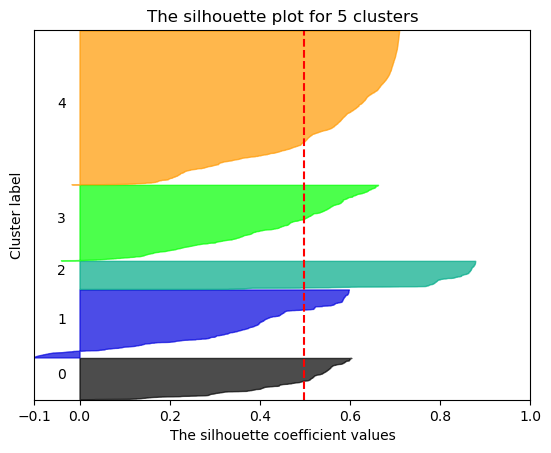

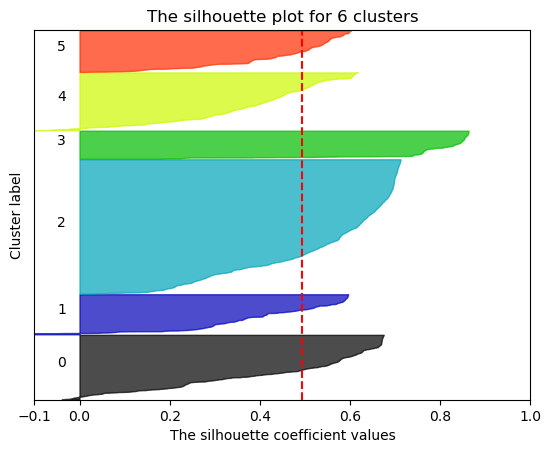

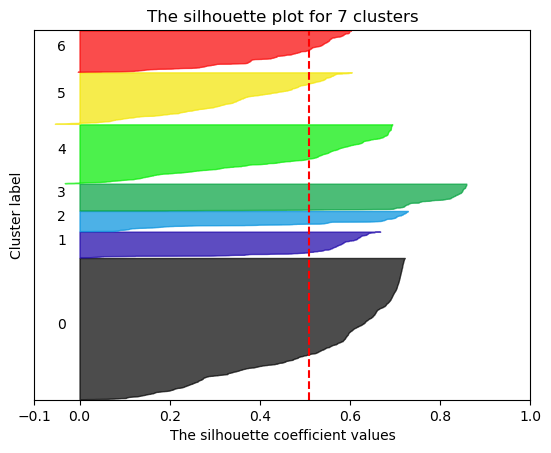

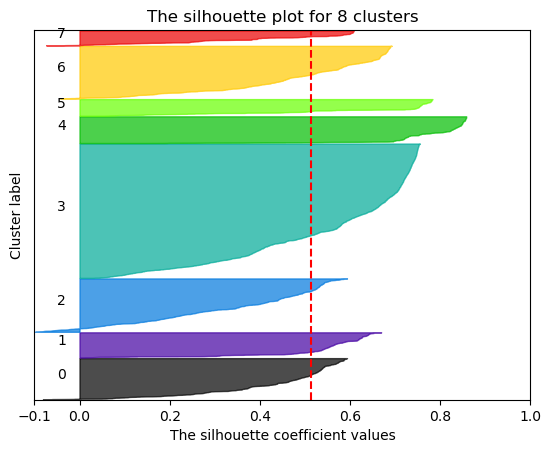

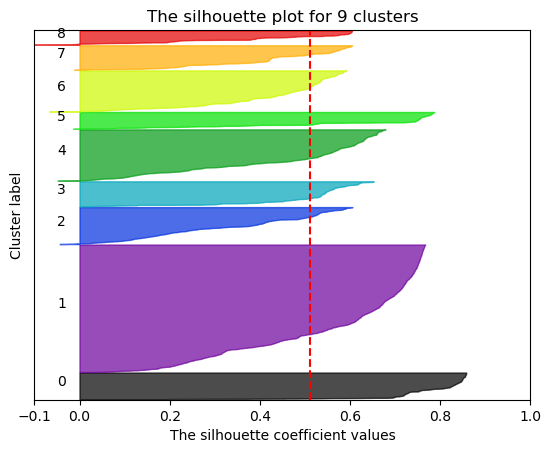

...

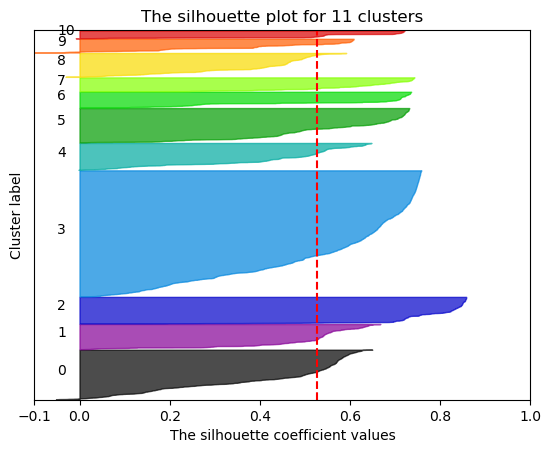

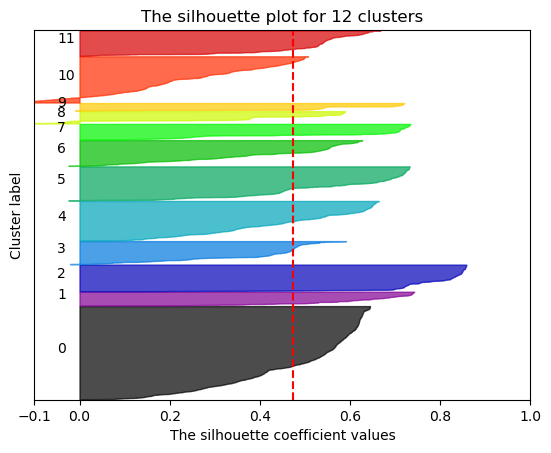

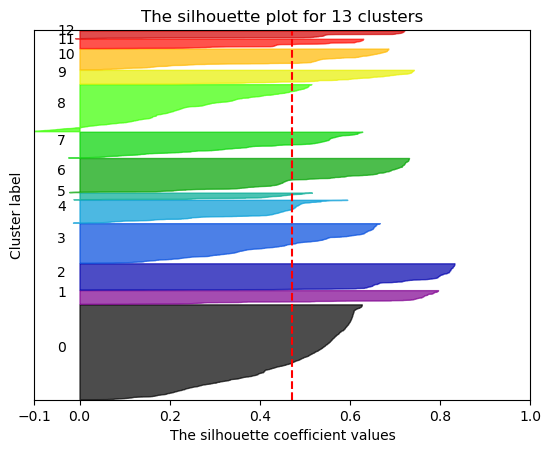

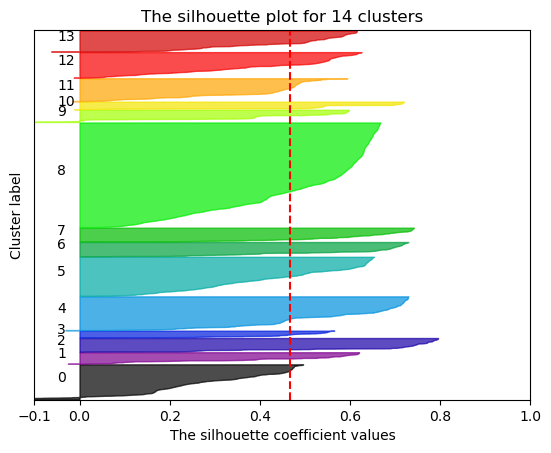

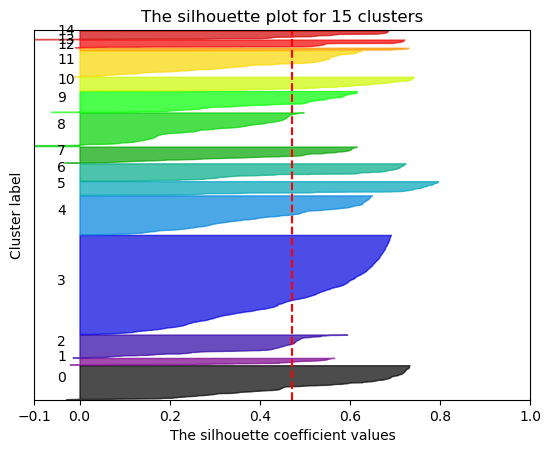

In [9]:
# Clustering with different number of cluster, 
# check the silhouette metric and perform model selection

k_check = np.arange(5, 16) # options
avg_sil = []               # store the metric for each option

# Using a for loop for ploting and model selection
for idx in range(len(k_check)):
    k = k_check[idx]
    # Code for plots adapted from
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py
    
    # Create a subplot 
    fig, ax = plt.subplots()
    #fig.set_size_inches(5, 4)

    # silhouette plot
    # The silhouette coefficient can range from -1, 1, but set it from -0.1 to 1
    ax.set_xlim([-0.1, 1])
    # The (k+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X) + (k + 1) * 10])

    # Initialize the clusterer with n_clusters
    clusterer = KMeans(n_clusters=k, random_state= None) # 10
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    
    # store this metric
    avg_sil = avg_sil + [silhouette_avg]
    
    # print the mertic
    print(
        "For n_clusters =",
        k,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    
    if  silhouette_avg >= max(avg_sil): # best metric so far
        print('New best is n_clusters =' + str(k))
        best_model = clusterer # best model so far, save it

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    # Using a for loop for ploting only
    for i in range(k):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
    # title of pot
    name = 'The silhouette plot for ' + str(k) +  ' clusters'
    ax.set_title(name)
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # save the plot in directory /figures/silhouette
    # check if dir exists
    if not(os.path.isdir('figures/silhouette')):
        os.mkdir('figures/silhouette') # if not, create it
    # save the plot
    plt.savefig('./figures/silhouette/' + name +'.png') # save it on the directory

    
plt.show()

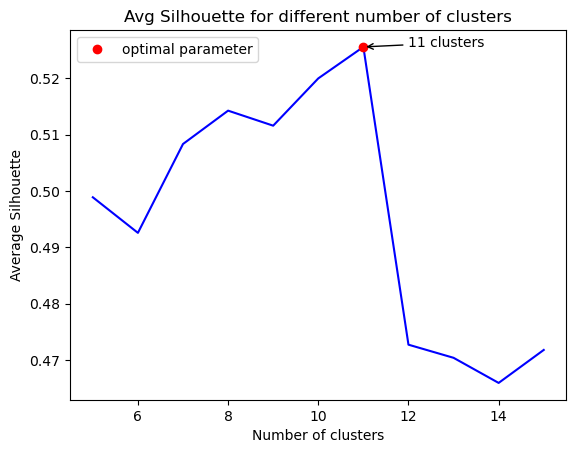

In [10]:
# select the number of clusters with the best score
n_clusters = k_check[np.argmax(avg_sil)]

# plto the metric against the number of clusters
plt.plot(k_check, avg_sil, 'b-')
# plot the global maxima (optimal parameter)
plt.plot(n_clusters, avg_sil[list(k_check).index(n_clusters)], 'ro', 
         label = 'optimal parameter')

# indicate the optimal parameter in the plot
plt.annotate(str(n_clusters) + ' clusters',
            xy=(n_clusters, avg_sil[list(k_check).index(n_clusters)]), 
            xytext=(n_clusters + 1, avg_sil[list(k_check).index(n_clusters)]),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"),
            )
plt.legend(loc='upper left')
plt.xlabel('Number of clusters')
plt.ylabel('Average Silhouette')
plt.title('Avg Silhouette for different number of clusters')
plt.savefig('./figures/optimal_parameter.png') # save it on the directory
plt.show()

In [11]:
model = best_model # retrieve the best model from model selection
# create the labels
y = model.fit_predict(X)

## Maps

In [12]:
#plot_without_clusters(X)
plot_without_clusters(X, 'map_no_cluster')

In [13]:
#plot_with_clusters(X, y)
plot_with_clusters(X, y, 'map_optimal')

## Manipulating data

In [14]:
# Add the cluster to the data frame
df['cluster'] = y
df.head()

,lat,lon,category,cluster
0,49.260812,-123.125736,food,1
1,49.260953,-123.125704,food,1
2,49.249848,-122.959708,food,10
3,49.370585,-123.274387,food,7
4,49.370574,-123.274363,food,7


In [15]:
# Pivot the table
pivot = pd.pivot_table(df, index = 'cluster', columns = 'category', values = 'lat', aggfunc = 'count')
pivot.head()

category,education,entertainment,food,payment
cluster,,,,
0,14,15,249,40
1,75,159,2085,192
2,39,28,414,56
3,16,11,391,65
4,5,10,157,18


In [16]:
# Normalize the data, useful for future results
 # each column sums to one
pivot_normalized = pivot.apply(lambda x: x / sum(x))
pivot_normalized.head()

category,education,entertainment,food,payment
cluster,,,,
0,0.048951,0.045181,0.041294,0.058565
1,0.262238,0.478916,0.345771,0.281113
2,0.136364,0.084337,0.068657,0.081991
3,0.055944,0.033133,0.064842,0.095168
4,0.017483,0.030120,0.026036,0.026354


## Visualization

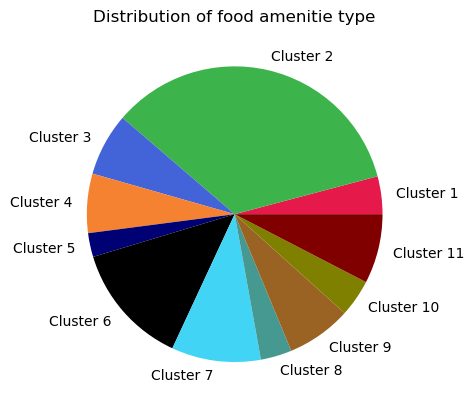

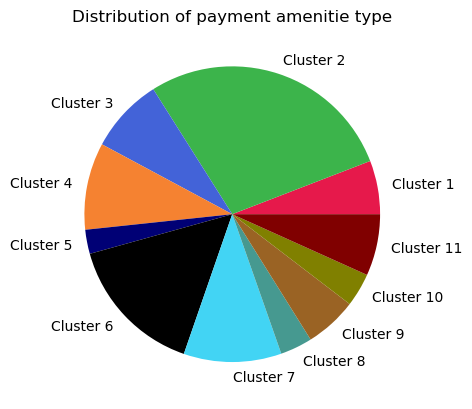

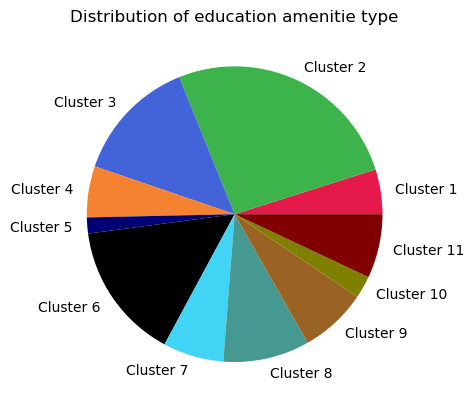

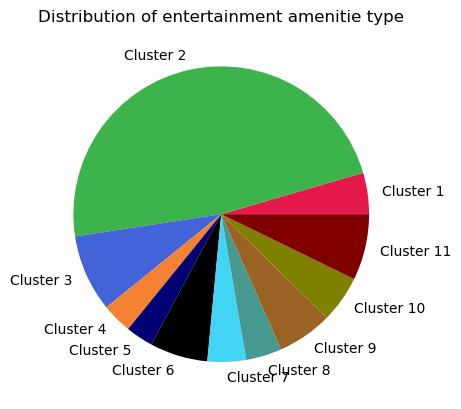

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# labels for the plots: 'Cluster i' for all i
labels = list(map(lambda x: 'Cluster ' + str(x+1), list(pivot_normalized.index)))

# Using a for loop for ploting only
# create a pie chart for each category
for category in categories:
    fig, ax = plt.subplots()
    data = pivot_normalized.loc[:, category]
    ax.pie(data, labels = labels, colors = colors)
    name = 'Distribution of ' + category +' amenitie type'
    plt.title(name)
    
    # save the plot in directory /figures/pie
    # check if dir exists
    if not(os.path.isdir('figures/pie')):
        os.mkdir('figures/pie') # if not, create it
    # save the plot
    plt.savefig('./figures/pie/' + name + '.png') # save it on the directory
    
plt.show()

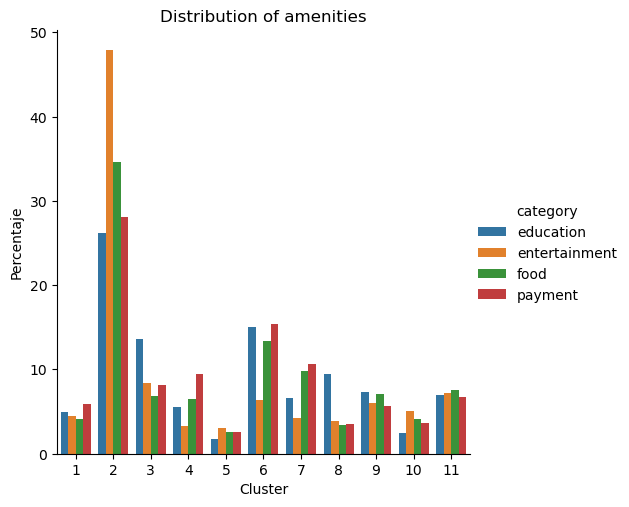

In [18]:
# show the distribution of all amenity types over the clusters
data_plot = pivot_normalized * 100
data_plot = data_plot.reset_index()
data_plot = data_plot.melt(['cluster'])
data_plot['cluster'] = data_plot['cluster'] + 1 # index starting in 1 for plots
g = sns.catplot(data = data_plot, x = 'cluster', y = 'value', hue = 'category', kind = 'bar')
g.set(xlabel = 'Cluster', ylabel = 'Percentaje')
plt.title('Distribution of amenities')
g.savefig('./figures/bar_chart.png') # save it
plt.show()

## Statistical tests

In [19]:
# Chi squares
from scipy.stats import chi2_contingency

In [20]:
# data in contingency table
pivot

category,education,entertainment,food,payment
cluster,,,,
0,14,15,249,40
1,75,159,2085,192
2,39,28,414,56
3,16,11,391,65
4,5,10,157,18
5,43,21,809,105
6,19,14,589,73
7,27,13,205,24
8,21,20,428,39


In [21]:
chi2, p, dof, expected = chi2_contingency(pivot)
print('P-value for Chi-square test of independence ' + str(p))
if p <= 0.05:
    print('The categories are not independent of one another')

P-value for Chi-square test of independence 9.833758773685649e-15
The categories are not independent of one another


In [22]:
print('Expected')
print(expected)

Expected
[[  12.40594735   14.40130951  261.5659528    29.62679034]
 [  97.96016914  113.71600055 2065.38398581  233.9398445 ]
 [  20.9496658    24.31919247  441.70099577   50.03014596]
 [  18.8429955    21.87368708  397.28413586   44.99918156]
 [   7.41235848    8.604556    156.28154413   17.7015414 ]
 [  38.15413995   44.29081981  804.43868504   91.1163552 ]
 [  27.11362706   31.47456009  571.66143773   64.75037512]
 [  10.49433911   12.1822398   221.26176511   25.06165598]
 [  19.81830582   23.0058655   417.84749693   47.32833174]
 [  11.46964943   13.31441822  241.82512618   27.39080617]
 [  21.37880235   24.81735098  450.74887464   51.05497204]]
